# Near-Miss Local Demo Notebook

This notebook is a standalone demo for the local pipeline.
It runs detection, tracking, and near-miss logic (v1.1 and v4.0) and visualization.

## What this notebook includes
1. Video sanity check and raw frame preview.
2. Detection quality preview.
3. Tracking stability diagnostics.
4. Near-miss outputs for v1.1 and v4.0.
5. Event dashboards (timeline, risk split, heatmap, frequency).
6. Per-frame debug view with 2s predicted future paths.
7. Optional annotated videos with predicted-path overlays.


## Run Guide

- Run all cells top-to-bottom once.
- If the video path or model path is different on your machine, update only the `Config` cell.
- For fast iteration, keep `MAX_FRAMES` small (for example: 200-400).
- For final export, increase `MAX_FRAMES` or set it to `None`.


## What Enhances Vanilla Near-Miss Logic

Compared to baseline pixel proximity + TTC, this project adds:

- **v1.1 geometry upgrades**: footpoint distance, closest-approach (`d_min`), scale-aware proximity, tighter IoU gate, leaky confirmation buffer, convergence guard.
- **False-positive controls**: stationary filter, direction filter, confidence gate, debounce + confirmation frames.
- **v4.0 motion refinement**: optical-flow velocity blended with trajectory velocity, with optional camera-motion compensation.
- **v2.0 physical reasoning**: ground-plane projection (`ground_pt`) and 3D closest-approach metrics when plane is valid.
- **Severity tuning knobs**: configurable cutoffs for `High` and `Medium` risk labels.

Current notebook defaults are stricter than baseline:
- `High` when `risk_score >= 0.55` (baseline was `0.70`)
- `Medium` when `risk_score >= 0.30` (baseline was `0.40`)


In [12]:
import os


def _find_project_root(start_dir: str) -> str:
    candidates = [start_dir, os.path.dirname(start_dir)]
    for c in candidates:
        if os.path.isdir(os.path.join(c, 'src')) and os.path.isdir(os.path.join(c, 'data')):
            return os.path.abspath(c)
    return os.path.abspath(start_dir)


PROJECT_ROOT = _find_project_root(os.getcwd())
VIDEO_PATH   = os.path.join(PROJECT_ROOT, 'data', 'traffic_video_2.mp4')
OUTPUT_DIR   = os.path.join(PROJECT_ROOT, 'outputs', 'local_demo')
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Detection
MODEL_NAME   = 'yolo26x.pt'
BACKEND      = 'ultralytics'
INPUT_SIZE   = 640
CONF_THRESH  = {'vehicle': 0.4, 'pedestrian': 0.7}
NMS_IOU      = None

# Runtime controls
MAX_FRAMES   = None      # None = full video
FRAME_STRIDE = 1

# Tracker
TRACKER_NAME = 'bytetrack'
MIN_HITS     = 5 # I infered this from track length distribution graph to eliminate false tracks
TRACKER_PARAMS = dict(
    track_thresh=0.25,
    track_buffer=90,
    match_thresh=0.8,
    frame_rate=30,       # overwritten after metadata read
    min_hits=MIN_HITS,
)

# Near-miss severity thresholds
RISK_HIGH_THRESHOLD = 0.55
RISK_MEDIUM_THRESHOLD = 0.30

# Near-miss base settings
NEARMISS_COMMON = dict(
    proximity_px=120,
    ttc_threshold=2.5,
    debounce_frames=20,
    filters_enabled=True,
    confirm_frames=3,
    min_confidence=0.3,
    same_direction_deg=15,
    stationary_speed_px=1,
    clearance_scale=1.1,
    risk_high_threshold=RISK_HIGH_THRESHOLD,
    risk_medium_threshold=RISK_MEDIUM_THRESHOLD,
)

# Debug predicted path overlay (for visual explanation)
PRED_HORIZON_SEC  = 1.5
PRED_STEP_SEC     = 0.2
PRED_MIN_SPEED_PX = 0.2
TRAIL_KEEP_FRAMES = 60

# Optional export
WRITE_ANNOTATED_VIDEOS = True

print('PROJECT_ROOT:', PROJECT_ROOT)
print('VIDEO_PATH  :', VIDEO_PATH)
print('OUTPUT_DIR  :', OUTPUT_DIR)
print('MODEL       :', MODEL_NAME)


PROJECT_ROOT: /Users/mina.essam/Downloads/tatweer
VIDEO_PATH  : /Users/mina.essam/Downloads/tatweer/data/traffic_video_2.mp4
OUTPUT_DIR  : /Users/mina.essam/Downloads/tatweer/outputs/local_demo
MODEL       : yolo26x.pt


## Imports


In [13]:
import sys
import time
import copy

if PROJECT_ROOT not in sys.path:
    sys.path.insert(0, PROJECT_ROOT)

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from IPython.display import display, Video

%matplotlib inline
plt.rcParams['figure.dpi'] = 110

from src.video_utils import get_video_metadata, sample_frames, frame_generator
from src.detector import create_detector, draw_detections
from src.tracker import create_tracker
from src.near_miss import NearMissDetectorV11, NearMissDetectorV40
from src.visualizer import (
    annotate_frame,
    create_annotated_video,
    plot_timeline,
    plot_risk_distribution,
    plot_heatmap,
    plot_frequency,
    generate_html_report,
)

print('Imports OK')


Imports OK


## Video Metadata Check

This validates the local asset, computes effective FPS after stride, and prints
clip context used for all downstream visuals.


In [14]:
assert os.path.exists(VIDEO_PATH), f'Video not found: {VIDEO_PATH}'

meta = get_video_metadata(VIDEO_PATH)
EFFECTIVE_FPS = meta['fps'] / FRAME_STRIDE
TRACKER_PARAMS['frame_rate'] = int(meta['fps'])

print(f"Resolution : {meta['width']} x {meta['height']}")
print(f"FPS        : {meta['fps']:.2f} (effective: {EFFECTIVE_FPS:.2f} with stride={FRAME_STRIDE})")
print(f"Frames     : {meta['frame_count']}")
print(f"Duration   : {meta['duration_sec']:.1f}s")
if MAX_FRAMES is not None:
    print(f"Run budget : first {MAX_FRAMES} processed frames (~{(MAX_FRAMES*FRAME_STRIDE)/meta['fps']:.1f}s)")


Resolution : 360 x 640
FPS        : 23.98 (effective: 23.98 with stride=1)
Frames     : 285
Duration   : 11.9s


## Raw Frame Preview

Quick scene sanity check before any model is run.


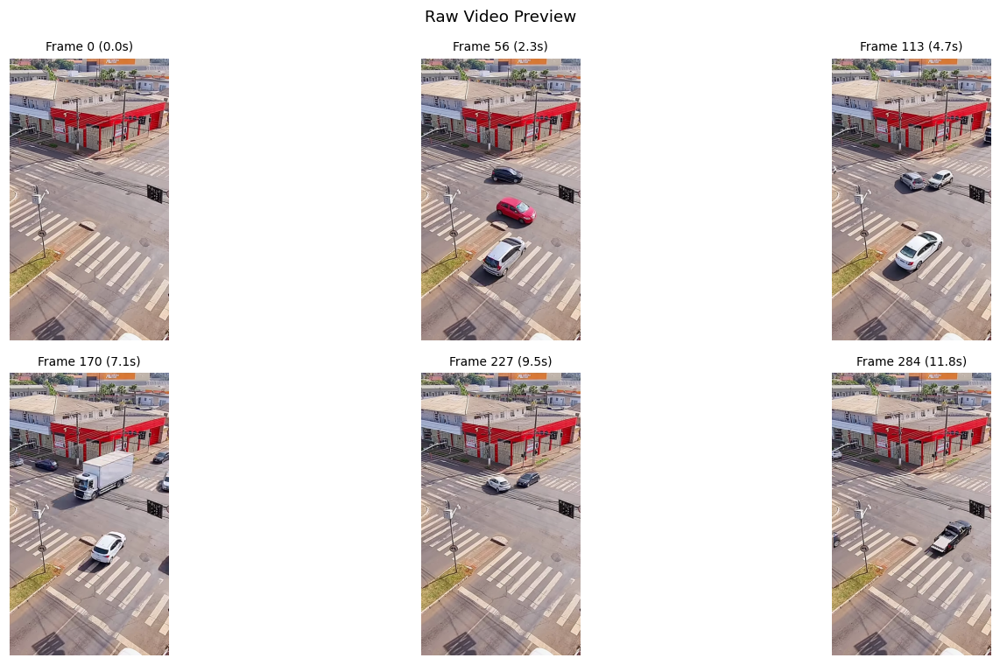

In [15]:
preview_frames = sample_frames(VIDEO_PATH, n=6)

fig, axes = plt.subplots(2, 3, figsize=(15, 7))
for ax, (idx, frame) in zip(axes.flatten(), preview_frames):
    ax.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    ax.set_title(f'Frame {idx} ({idx/meta["fps"]:.1f}s)', fontsize=9)
    ax.axis('off')
plt.suptitle('Raw Video Preview', fontsize=12)
plt.tight_layout()
plt.show()


## Detection Preview

Run detector on sampled frames to verify confidence thresholds and object coverage.


Loading yolo26x.pt on cpu ...
Model ready.


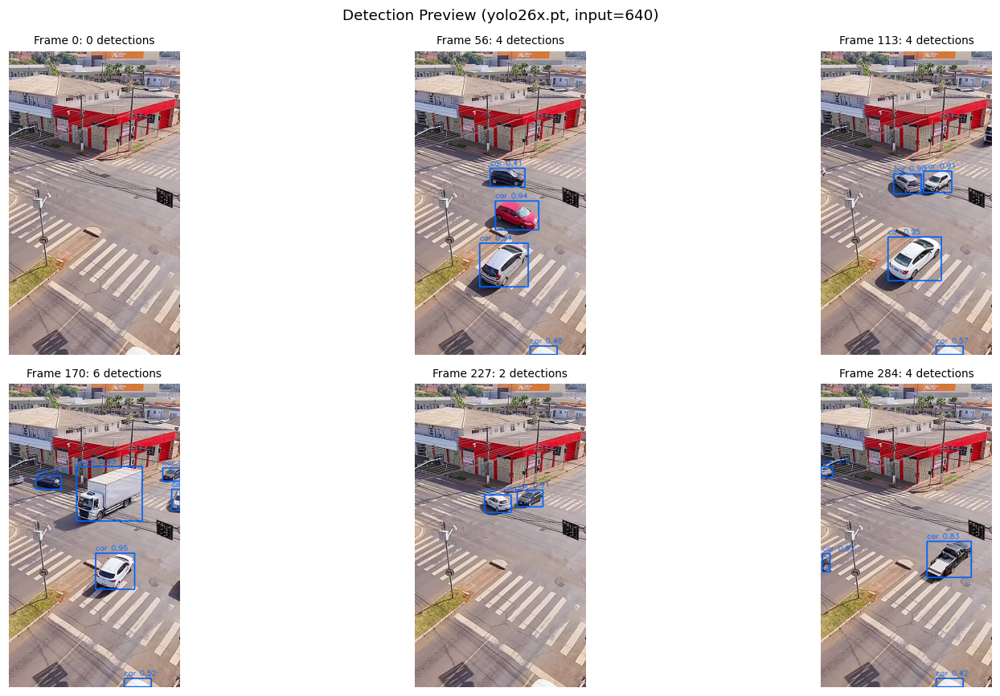

Average detector inference so far: 262.8 ms/frame


In [16]:
detector = create_detector(
    model_name=MODEL_NAME,
    backend=BACKEND,
    conf=CONF_THRESH,
    nms_iou=NMS_IOU,
    input_size=INPUT_SIZE,
)

frames_det = sample_frames(VIDEO_PATH, n=6)
fig, axes = plt.subplots(2, 3, figsize=(16, 8))
for ax, (idx, frame) in zip(axes.flatten(), frames_det):
    dets = detector.detect(frame)
    ann = draw_detections(frame, dets)
    ax.imshow(cv2.cvtColor(ann, cv2.COLOR_BGR2RGB))
    ax.set_title(f'Frame {idx}: {len(dets)} detections', fontsize=9)
    ax.axis('off')

plt.suptitle(f'Detection Preview ({MODEL_NAME}, input={INPUT_SIZE})', fontsize=12)
plt.tight_layout()
plt.show()

print(f'Average detector inference so far: {detector.avg_inference_ms:.1f} ms/frame')
detector.reset_timing()


## Single-Pass Pipeline Run (v1.1 + v4.0)

One detection+tracking pass is reused by both near-miss variants for fair comparison.

Important implementation detail:
- Track snapshots are stored with `deepcopy`.
- This avoids future trajectory points leaking into past frames during replay,
  which can visually place trails/arrows ahead of objects.


In [17]:
tracker = create_tracker(TRACKER_NAME, **TRACKER_PARAMS)

nm_v11 = NearMissDetectorV11(
    fps=EFFECTIVE_FPS,
    **NEARMISS_COMMON,
)
nm_v40 = NearMissDetectorV40(
    fps=EFFECTIVE_FPS,
    flow_weight=0.7,
    flow_min_magnitude=1.0,
    flow_percentile=50.0,
    flow_min_pixels=20,
    compensate_camera=True,
    **NEARMISS_COMMON,
)

runs = {
    'v11': {'nm': nm_v11, 'frame_data': {}, 'pair_data': {}},
    'v40': {'nm': nm_v40, 'frame_data': {}, 'pair_data': {}},
}

def snapshot_tracks(tracked, trail_keep=TRAIL_KEEP_FRAMES):
    snap = copy.deepcopy(tracked)
    for obj in snap.values():
        traj = obj.get('trajectory', None)
        if isinstance(traj, list) and trail_keep and len(traj) > trail_keep:
            obj['trajectory'] = traj[-trail_keep:]
    return snap

processed = 0
det_counts = []
active_counts = []

start = time.perf_counter()
for frame_idx, frame in frame_generator(VIDEO_PATH, stride=FRAME_STRIDE):
    if MAX_FRAMES is not None and processed >= MAX_FRAMES:
        break

    dets = detector.detect(frame)
    tracked = tracker.update(dets, frame_idx, frame)

    # Process both variants on the same tracked state
    nm_v11.process_frame(frame_idx, tracked)
    nm_v40.process_frame(frame_idx, tracked, frame=frame)

    snap = snapshot_tracks(tracked)
    for variant, pack in runs.items():
        nm = pack['nm']
        pack['frame_data'][frame_idx] = (copy.deepcopy(snap), list(nm.active_pairs(frame_idx)))
        pack['pair_data'][frame_idx] = copy.deepcopy(nm.active_pair_data(frame_idx))

    processed += 1
    det_counts.append(len(dets))
    active_counts.append(len(tracked))

elapsed = time.perf_counter() - start
analysed_sec = (processed * FRAME_STRIDE) / meta['fps'] if MAX_FRAMES is not None else meta['duration_sec']

for variant, pack in runs.items():
    df = pack['nm'].get_events_dataframe()
    pack['events_df'] = df
    pack['summary'] = {
        'total': len(df),
        'high': int((df['risk_level'] == 'High').sum()) if not df.empty else 0,
        'medium': int((df['risk_level'] == 'Medium').sum()) if not df.empty else 0,
        'low': int((df['risk_level'] == 'Low').sum()) if not df.empty else 0,
    }

track_lengths = [len(t) for t in tracker.all_trajectories.values()]
tracker_stats = {
    'total_ids': int(tracker.total_ids_assigned),
    'peak_active': int(max(active_counts) if active_counts else 0),
    'avg_track_length': round(float(np.mean(track_lengths)), 1) if track_lengths else 0.0,
}

summary_df = pd.DataFrame([
    {
        'variant': k,
        'events_total': v['summary']['total'],
        'high': v['summary']['high'],
        'medium': v['summary']['medium'],
        'low': v['summary']['low'],
    }
    for k, v in runs.items()
])

print(f'Processed {processed} frames in {elapsed:.1f}s ({processed/max(elapsed, 1e-6):.1f} processed FPS)')
print(f'Detector avg inference: {detector.avg_inference_ms:.1f} ms/frame')
print(f"Tracker IDs: {tracker_stats['total_ids']} | peak active: {tracker_stats['peak_active']} | avg track length: {tracker_stats['avg_track_length']}")
display(summary_df)


SUCCESS  | ByteTrack: det_thresh=0.3, max_age=30, max_obs=50, min_hits=3, iou_threshold=0.3, per_class=False, asso_func=iou, min_conf=0.1, track_thresh=0.25, match_thresh=0.8, track_buffer=90, frame_rate=23


Processed 285 frames in 55.8s (5.1 processed FPS)
Detector avg inference: 172.0 ms/frame
Tracker IDs: 15 | peak active: 8 | avg track length: 83.8


,variant,events_total,high,medium,low
0,v11,6,3,3,0
1,v40,7,3,4,0


## Tracking Diagnostics

These plots help verify tracker quality and ID continuity independent of near-miss labels.


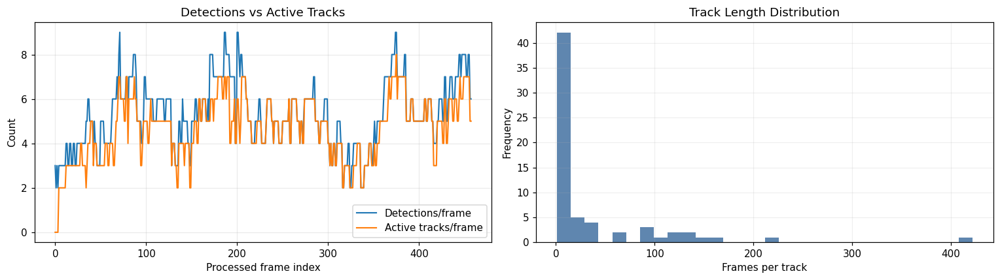

In [7]:
fig, axes = plt.subplots(1, 2, figsize=(14, 4))

axes[0].plot(det_counts, label='Detections/frame', linewidth=1.4)
axes[0].plot(active_counts, label='Active tracks/frame', linewidth=1.4)
axes[0].set_title('Detections vs Active Tracks')
axes[0].set_xlabel('Processed frame index')
axes[0].set_ylabel('Count')
axes[0].grid(alpha=0.25)
axes[0].legend()

if track_lengths:
    axes[1].hist(track_lengths, bins=min(30, max(10, len(track_lengths)//2)), color='#4e79a7', alpha=0.9)
axes[1].set_title('Track Length Distribution')
axes[1].set_xlabel('Frames per track')
axes[1].set_ylabel('Frequency')
axes[1].grid(alpha=0.2)

plt.tight_layout()
plt.show()


## Event Tables (v1.1 vs v4.0)

Use this to inspect event-level differences between trajectory-based velocity (v1.1)
and optical-flow-enhanced velocity (v4.0).


In [7]:
events_v11 = runs['v11']['events_df']
events_v40 = runs['v40']['events_df']

print('v1.1 events:', len(events_v11))
if events_v11.empty:
    print('  None')
else:
    display(events_v11[[
        'frame_index', 'timestamp_sec', 'object_id_1', 'object_id_2',
        'label_1', 'label_2', 'distance_px', 'ttc_sec', 'd_min_px',
        'risk_score', 'risk_level'
    ]].head(20))

print('\nv4.0 events:', len(events_v40))
if events_v40.empty:
    print('  None')
else:
    cols = [
        'frame_index', 'timestamp_sec', 'object_id_1', 'object_id_2',
        'label_1', 'label_2', 'distance_px', 'ttc_sec', 'd_min_px',
        'vel_source_1', 'vel_source_2', 'speed_1_px', 'speed_2_px',
        'risk_score', 'risk_level'
    ]
    cols = [c for c in cols if c in events_v40.columns]
    display(events_v40[cols].head(20))


v1.1 events: 8


,frame_index,timestamp_sec,object_id_1,object_id_2,label_1,label_2,distance_px,ttc_sec,d_min_px,risk_score,risk_level
0,89,4.45,6,5,truck,truck,111.10,1.219,36.87,0.5006,Medium
1,136,6.80,7,10,car,truck,107.70,0.970,65.91,0.4164,Medium
2,142,7.10,7,25,car,truck,108.91,0.738,71.78,0.4246,Medium
3,212,10.60,7,30,car,car,66.90,0.113,66.18,0.5697,High
4,248,12.40,38,27,bus,car,95.00,0.086,90.83,0.4616,Medium
5,278,13.90,38,34,bus,truck,115.05,1.163,75.38,0.3436,Medium
6,332,16.60,7,34,car,truck,99.36,5.000,7.52,0.4513,Medium
7,352,17.60,7,34,car,truck,64.62,0.476,46.97,0.5965,High



v4.0 events: 7


,frame_index,timestamp_sec,object_id_1,object_id_2,label_1,label_2,distance_px,ttc_sec,d_min_px,vel_source_1,vel_source_2,speed_1_px,speed_2_px,risk_score,risk_level
0,89,4.45,6,5,truck,truck,111.10,1.219,36.87,trajectory,trajectory,7.21,2.91,0.5006,Medium
1,142,7.10,7,25,car,truck,108.91,0.997,68.05,trajectory,flow+traj,0.00,4.26,0.4033,Medium
2,150,7.50,7,10,car,truck,91.19,0.172,88.27,trajectory,flow+traj,0.25,6.88,0.4573,Medium
3,212,10.60,7,30,car,car,66.90,0.039,66.71,trajectory,flow+traj,0.25,6.56,0.5834,High
4,248,12.40,38,27,bus,car,95.00,0.052,91.21,flow+traj,flow+traj,14.31,11.61,0.4807,Medium
5,332,16.60,7,34,car,truck,99.36,2.047,12.04,flow+traj,flow+traj,1.67,1.58,0.4906,Medium
6,352,17.60,7,34,car,truck,64.62,0.388,50.84,flow+traj,flow+traj,1.73,3.41,0.5934,High


## Dashboard Visuals

For each variant, this section saves and renders:
- Timeline of event occurrence.
- Risk-level distribution.
- Spatial heatmap of tracked activity.
- Event frequency by time bins.


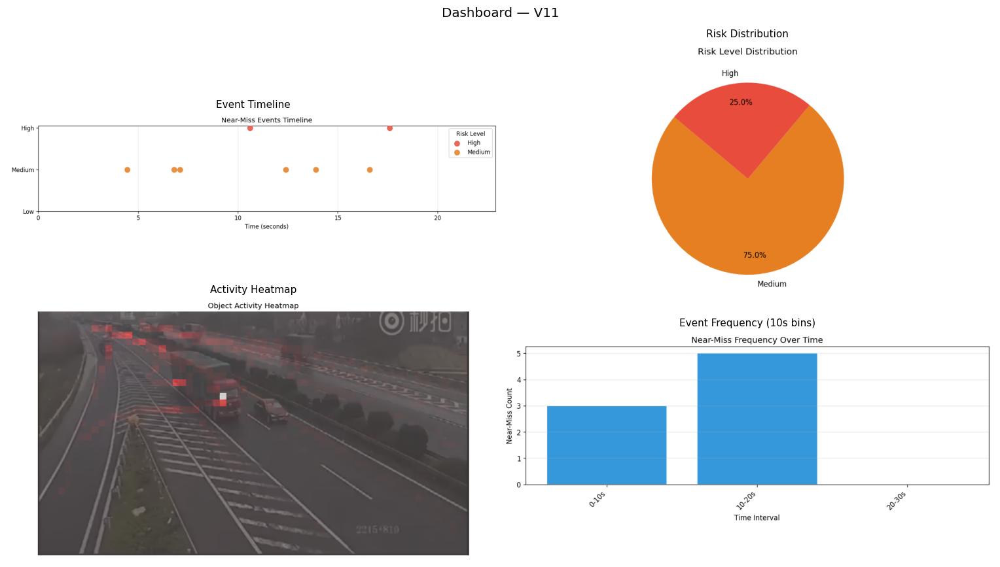

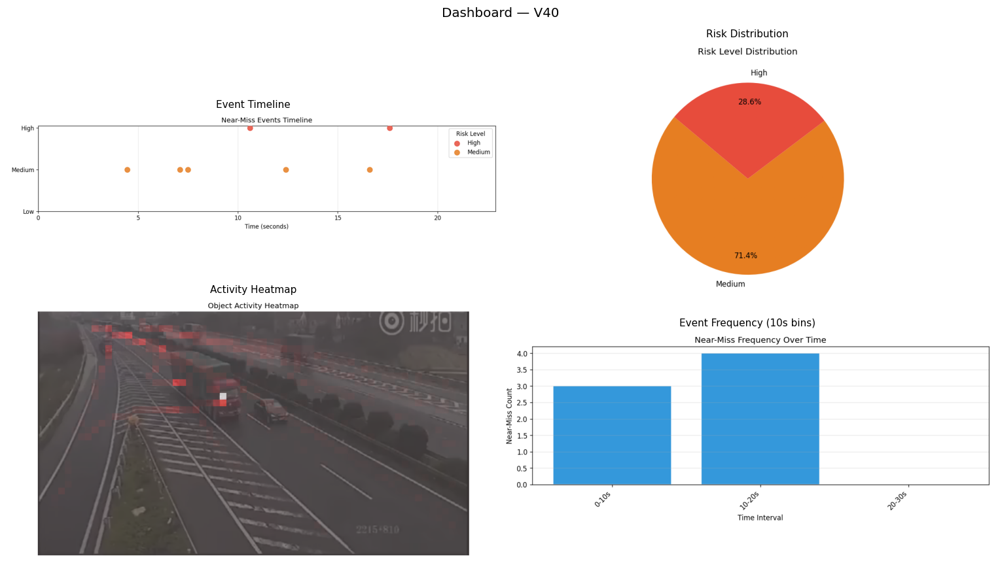

In [8]:
cap = cv2.VideoCapture(VIDEO_PATH)
ret, first_frame = cap.read()
cap.release()
assert ret, 'Could not read first frame from video.'

dashboard_paths = {}

for variant, pack in runs.items():
    out_dir_var = os.path.join(OUTPUT_DIR, variant)
    os.makedirs(out_dir_var, exist_ok=True)
    df = pack['events_df']

    path_timeline = os.path.join(out_dir_var, 'timeline.png')
    path_pie      = os.path.join(out_dir_var, 'risk_distribution.png')
    path_heatmap  = os.path.join(out_dir_var, 'heatmap.png')
    path_freq     = os.path.join(out_dir_var, 'frequency.png')

    plot_timeline(df, analysed_sec, path_timeline)
    plot_risk_distribution(df, path_pie)
    plot_heatmap(tracker.all_trajectories, first_frame, path_heatmap)
    plot_frequency(df, analysed_sec, path_freq, bin_sec=10)

    dashboard_paths[variant] = {
        'timeline': path_timeline,
        'risk_distribution': path_pie,
        'heatmap': path_heatmap,
        'frequency': path_freq,
    }

for variant in ['v11', 'v40']:
    fig, axes = plt.subplots(2, 2, figsize=(14, 8))
    items = [
        ('timeline', 'Event Timeline'),
        ('risk_distribution', 'Risk Distribution'),
        ('heatmap', 'Activity Heatmap'),
        ('frequency', 'Event Frequency (10s bins)'),
    ]
    for ax, (key, title) in zip(axes.flatten(), items):
        path = dashboard_paths[variant][key]
        ax.imshow(mpimg.imread(path))
        ax.set_title(title, fontsize=10)
        ax.axis('off')
    plt.suptitle(f'Dashboard — {variant.upper()}', fontsize=13)
    plt.tight_layout()
    plt.show()


## Adjacent-Lane False-Positive Diagnostic

If two vehicles are far enough in predicted closest approach (`d_min_px`) they should
not be flagged. This plot helps inspect whether flagged events are physically plausible.


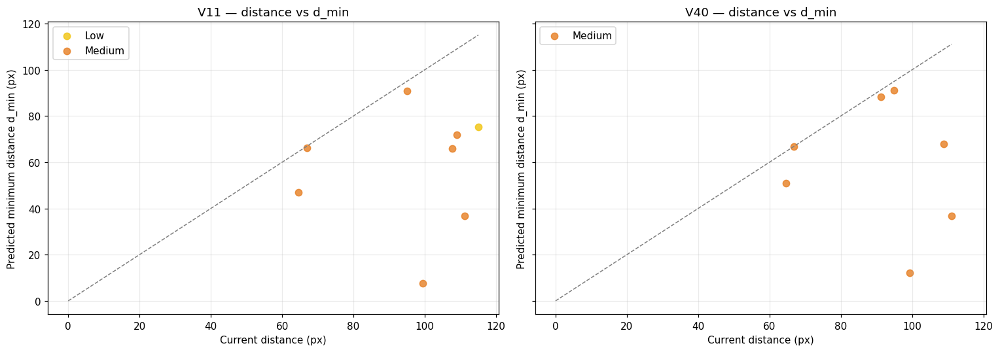


Top 10 largest d_min events (v11):


,frame_index,object_id_1,object_id_2,distance_px,d_min_px,ttc_sec,risk_score,risk_level
4,248,38,27,95.00,90.83,0.086,0.4616,Medium
5,278,38,34,115.05,75.38,1.163,0.3436,Low
2,142,7,25,108.91,71.78,0.738,0.4246,Medium
3,212,7,30,66.90,66.18,0.113,0.5697,Medium
1,136,7,10,107.70,65.91,0.970,0.4164,Medium
7,352,7,34,64.62,46.97,0.476,0.5965,Medium
0,89,6,5,111.10,36.87,1.219,0.5006,Medium
6,332,7,34,99.36,7.52,5.000,0.4513,Medium



Top 10 largest d_min events (v40):


,frame_index,object_id_1,object_id_2,distance_px,d_min_px,ttc_sec,risk_score,risk_level
4,248,38,27,95.00,91.21,0.052,0.4807,Medium
2,150,7,10,91.19,88.27,0.172,0.4573,Medium
1,142,7,25,108.91,68.05,0.997,0.4033,Medium
3,212,7,30,66.90,66.71,0.039,0.5834,Medium
6,352,7,34,64.62,50.84,0.388,0.5934,Medium
0,89,6,5,111.10,36.87,1.219,0.5006,Medium
5,332,7,34,99.36,12.04,2.047,0.4906,Medium


In [10]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5), sharex=True, sharey=True)

for ax, variant in zip(axes, ['v11', 'v40']):
    df = runs[variant]['events_df']
    if df.empty:
        ax.text(0.5, 0.5, 'No events', ha='center', va='center', transform=ax.transAxes)
    else:
        color_map = {'High': '#e74c3c', 'Medium': '#e67e22', 'Low': '#f1c40f'}
        for level, sub in df.groupby('risk_level'):
            ax.scatter(sub['distance_px'], sub['d_min_px'], s=45,
                       c=color_map.get(level, '#3498db'), alpha=0.8, label=level)
        m = max(float(df['distance_px'].max()), float(df['d_min_px'].max()))
        ax.plot([0, m], [0, m], '--', color='gray', linewidth=1)
    ax.set_title(f'{variant.upper()} — distance vs d_min')
    ax.set_xlabel('Current distance (px)')
    ax.set_ylabel('Predicted minimum distance d_min (px)')
    ax.grid(alpha=0.25)
    ax.legend(loc='upper left')

plt.tight_layout()
plt.show()

for variant in ['v11', 'v40']:
    df = runs[variant]['events_df']
    if df.empty:
        continue
    print(f'\nTop 10 largest d_min events ({variant}):')
    display(df.sort_values('d_min_px', ascending=False).head(10)[[
        'frame_index', 'object_id_1', 'object_id_2',
        'distance_px', 'd_min_px', 'ttc_sec', 'risk_score', 'risk_level'
    ]])


## Per-Frame Debug Overlay with Future Paths

This view explicitly renders predicted paths (1.5s horizon) for each tracked object.
Use it to explain why a pair was or was not classified as near-miss.


Inspect frame: 352


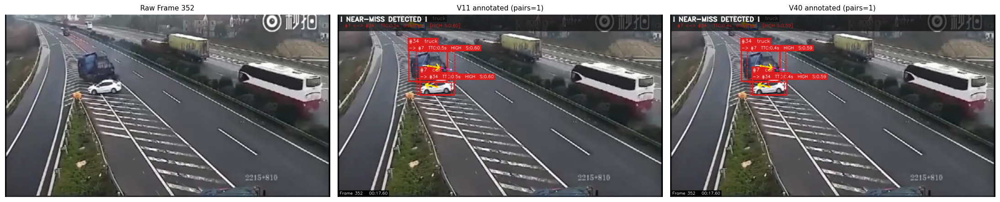

In [9]:
def _choose_debug_frame(variant='v11'):
    df = runs[variant]['events_df']
    if not df.empty:
        return int(df.sort_values('risk_score', ascending=False).iloc[0]['frame_index'])
    keys = sorted(runs[variant]['frame_data'].keys())
    return int(keys[len(keys)//2])

INSPECT_FRAME_IDX = _choose_debug_frame('v11')
print('Inspect frame:', INSPECT_FRAME_IDX)

cap = cv2.VideoCapture(VIDEO_PATH)
cap.set(cv2.CAP_PROP_POS_FRAMES, INSPECT_FRAME_IDX)
ok, raw_frame = cap.read()
cap.release()
assert ok, f'Could not read frame {INSPECT_FRAME_IDX}'

panels = [raw_frame]
titles = [f'Raw Frame {INSPECT_FRAME_IDX}']

for variant in ['v11', 'v40']:
    tracked_snap, active_pairs = runs[variant]['frame_data'][INSPECT_FRAME_IDX]
    pair_data = runs[variant]['pair_data'].get(INSPECT_FRAME_IDX, {})
    ann = annotate_frame(
        raw_frame,
        tracked_snap,
        active_pairs,
        INSPECT_FRAME_IDX,
        EFFECTIVE_FPS,
        pair_data=pair_data,
        debug_pred_paths=True,
        pred_horizon_sec=PRED_HORIZON_SEC,
        pred_step_sec=PRED_STEP_SEC,
        pred_min_speed_px=PRED_MIN_SPEED_PX,
    )
    panels.append(ann)
    titles.append(f'{variant.upper()} annotated (pairs={len(active_pairs)})')

fig, axes = plt.subplots(1, 3, figsize=(20, 6))
for ax, img, title in zip(axes, panels, titles):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(title, fontsize=10)
    ax.axis('off')
plt.tight_layout()
plt.show()


## Optional: Export Annotated Videos

When enabled, this writes one annotated video per variant with predicted paths.


In [18]:
video_outputs = {}

if WRITE_ANNOTATED_VIDEOS:
    for variant, pack in runs.items():
        out_path = os.path.join(OUTPUT_DIR, f'annotated_{variant}.mp4')
        print(f'Writing {variant} -> {out_path}')
        create_annotated_video(
            video_path=VIDEO_PATH,
            output_path=out_path,
            frame_data=pack['frame_data'],
            fps=EFFECTIVE_FPS,
            frame_pair_data=pack['pair_data'],
            debug_pred_paths=True,
            pred_horizon_sec=PRED_HORIZON_SEC,
            pred_step_sec=PRED_STEP_SEC,
            pred_min_speed_px=PRED_MIN_SPEED_PX,
        )
        video_outputs[variant] = out_path

    print('\nGenerated videos:')
    for k, p in video_outputs.items():
        print(f'  {k}: {p}  ({os.path.getsize(p)/1e6:.1f} MB)')

    # Inline preview (v11)
    if 'v11' in video_outputs:
        display(Video(video_outputs['v11'], embed=True, width=900))
else:
    print('WRITE_ANNOTATED_VIDEOS=False -> skipped video export')


Writing v11 -> /Users/mina.essam/Downloads/tatweer/outputs/local_demo/annotated_v11.mp4
Annotated video saved: /Users/mina.essam/Downloads/tatweer/outputs/local_demo/annotated_v11.mp4
Writing v40 -> /Users/mina.essam/Downloads/tatweer/outputs/local_demo/annotated_v40.mp4
Annotated video saved: /Users/mina.essam/Downloads/tatweer/outputs/local_demo/annotated_v40.mp4

Generated videos:
  v11: /Users/mina.essam/Downloads/tatweer/outputs/local_demo/annotated_v11.mp4  (7.2 MB)
  v40: /Users/mina.essam/Downloads/tatweer/outputs/local_demo/annotated_v40.mp4  (7.3 MB)


## Export HTML Reports

This creates one self-contained HTML summary per variant for easy sharing.


In [11]:
report_paths = {}
for variant, pack in runs.items():
    report_path = os.path.join(OUTPUT_DIR, f'report_{variant}.html')
    generate_html_report(
        metadata=meta,
        events_df=pack['events_df'],
        tracker_stats=tracker_stats,
        img_paths=dashboard_paths[variant],
        output_path=report_path,
    )
    report_paths[variant] = report_path

print('Artifacts')
print('  Output dir:', OUTPUT_DIR)
for variant in ['v11', 'v40']:
    print(f"  {variant}: events={runs[variant]['summary']['total']}, report={report_paths[variant]}")


HTML report saved: /Users/mina.essam/Downloads/tatweer/outputs/local_demo/report_v11.html
HTML report saved: /Users/mina.essam/Downloads/tatweer/outputs/local_demo/report_v40.html
Artifacts
  Output dir: /Users/mina.essam/Downloads/tatweer/outputs/local_demo
  v11: events=8, report=/Users/mina.essam/Downloads/tatweer/outputs/local_demo/report_v11.html
  v40: events=7, report=/Users/mina.essam/Downloads/tatweer/outputs/local_demo/report_v40.html


## Ground Plane Concept and v2.0 Progress

This section demonstrates the geometric path:
1. Fit a ground plane from monocular depth + road segmentation.
2. Project each detection footpoint from image pixels to 3D ground coordinates.
3. Run `NearMissDetectorV20` (v2.0), which uses 3D distance and 3D closest-approach.

If a valid stable plane is not available, v2.0 still runs in 2D fallback mode and
marks events with `mode='2d'`.


In [14]:
from pathlib import Path

SCENE_ENABLE = True
SCENE_MAX_FRAMES = 30
SCENE_STRIDE = 2
SCENE_OUTPUT_DIR = os.path.join(OUTPUT_DIR, 'scene_understanding_bootstrap')

SCENE_USE_REAL_MODELS = True
SCENE_ALLOW_DUMMY_FALLBACK = True

# v2.0 tuning for DepthAnythingV2 relative depth scale
V20_PROXIMITY_3D = 0.05
V20_SPEED_3D_MIN = 0.0005
V20_MAX_DIST_3D  = 0.10
V20_GP_DEDUP_DIST = 0.02
V20_PX_DEDUP_DIST = 60.0

WRITE_V20_VIDEO = True

print('SCENE_OUTPUT_DIR:', SCENE_OUTPUT_DIR)
print('SCENE_MAX_FRAMES:', SCENE_MAX_FRAMES)
print('SCENE_STRIDE    :', SCENE_STRIDE)


SCENE_OUTPUT_DIR: /Users/mina.essam/Downloads/tatweer/outputs/local_demo/scene_understanding_bootstrap
SCENE_MAX_FRAMES: 30
SCENE_STRIDE    : 2


In [15]:
import warnings
from scene_understanding import SceneConfig, DepthAnythingV2Estimator, SegFormerRoadSegmenter
from scene_understanding.run_scene_understanding import run_pipeline, _iter_video

scene_tracker = None
scene_summary = None
scene_cfg = None
stable_plane = None

if not SCENE_ENABLE:
    print('SCENE_ENABLE=False -> skipped scene-understanding run')
else:
    scene_cfg = SceneConfig(
        device='auto',
        fp16=True,
        seg_mode='cityscapes',
        depth_resize_long_side=768,
        seg_resize_long_side=1024,
        stride_seg=SCENE_STRIDE,
        stride_depth=SCENE_STRIDE,
        num_bootstrap_frames=SCENE_MAX_FRAMES,
        ransac_iters=150,
        min_inlier_ratio=0.30,
        output_dir=SCENE_OUTPUT_DIR,
        save_overlay_video=True,
        include_sidewalk=True,
    )

    segmenter = None
    estimator = None

    if SCENE_USE_REAL_MODELS and DepthAnythingV2Estimator is not None and SegFormerRoadSegmenter is not None:
        try:
            segmenter = SegFormerRoadSegmenter(
                model_id=scene_cfg.effective_seg_model_id(),
                seg_mode=scene_cfg.seg_mode,
                device=scene_cfg.device,
                fp16=scene_cfg.fp16,
                resize_long_side=scene_cfg.seg_resize_long_side,
                road_dilate_px=scene_cfg.road_dilate_px,
                min_area_px=scene_cfg.min_area_px,
                include_sidewalk=scene_cfg.include_sidewalk,
            )
            estimator = DepthAnythingV2Estimator(
                model_id=scene_cfg.effective_depth_model_id(),
                device=scene_cfg.device,
                fp16=scene_cfg.fp16,
                resize_long_side=scene_cfg.depth_resize_long_side,
            )
            print('Scene models: using real SegFormer + DepthAnythingV2')
        except Exception as e:
            if not SCENE_ALLOW_DUMMY_FALLBACK:
                raise
            warnings.warn(f'Real scene models failed: {e}. Falling back to dummy models.', stacklevel=1)

    if segmenter is None or estimator is None:
        segmenter = scene_cfg.build_segmenter()
        estimator = scene_cfg.build_depth_estimator()
        print(f'Scene models: fallback objects -> {type(segmenter).__name__}, {type(estimator).__name__}')

    scene_tracker = run_pipeline(
        cfg=scene_cfg,
        source_path=VIDEO_PATH,
        frame_iter=_iter_video(VIDEO_PATH, stride=SCENE_STRIDE, max_frames=SCENE_MAX_FRAMES),
        segmenter=segmenter,
        estimator=estimator,
        mode='bootstrap',
    )

    scene_summary = scene_tracker.get_summary_dict()
    stable_plane = scene_tracker.stable_plane

    print('\nScene bootstrap summary')
    print(f"  frames processed   : {scene_summary['total_frames']}")
    print(f"  valid plane frames : {scene_summary['valid_plane_frames']} ({scene_summary['valid_ratio']:.1%})")
    if stable_plane is not None:
        print(f"  stable plane valid : {stable_plane.valid}")
        print(f"  n                 : {np.round(stable_plane.n, 5)}")
        print(f"  d                 : {stable_plane.d:.6f}")
        print(f"  inlier ratio      : {stable_plane.inlier_ratio:.3f}")
    else:
        print('  stable plane       : None')


Scene models: using real SegFormer + DepthAnythingV2
[SceneUnderstanding] mode=bootstrap  source=/Users/mina.essam/Downloads/tatweer/data/traffic_video.mp4
[SceneUnderstanding] output → /Users/mina.essam/Downloads/tatweer/outputs/local_demo/scene_understanding_bootstrap
[SceneUnderstanding] intrinsics: fx=1088.0 fy=1088.0 cx=640.0 cy=360.0


Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


  frame    38  processed=20  5.5 fr/s  plane: d=-0.017 ir=0.95

[SceneUnderstanding] done — 30 frames in 5.3s
[SceneUnderstanding] cube debug records not collected (cube overlay debug is currently disabled).
[SceneUnderstanding] plane_params.json → /Users/mina.essam/Downloads/tatweer/outputs/local_demo/scene_understanding_bootstrap/plane_params.json
[SceneUnderstanding] plane_diagnostics.png → /Users/mina.essam/Downloads/tatweer/outputs/local_demo/scene_understanding_bootstrap/plane_diagnostics.png
[SceneUnderstanding] summary_report.md → /Users/mina.essam/Downloads/tatweer/outputs/local_demo/scene_understanding_bootstrap/summary_report.md

Scene bootstrap summary
  frames processed   : 30
  valid plane frames : 30 (100.0%)
  stable plane valid : True
  n                 : [    0.00025    -0.96186    -0.27355]
  d                 : 0.092598
  inlier ratio      : 0.917


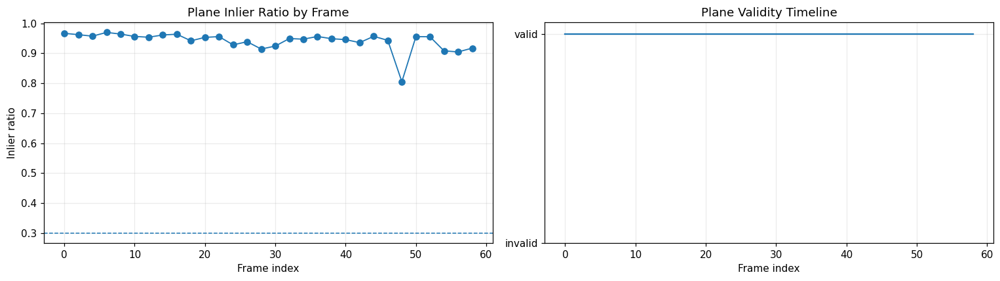

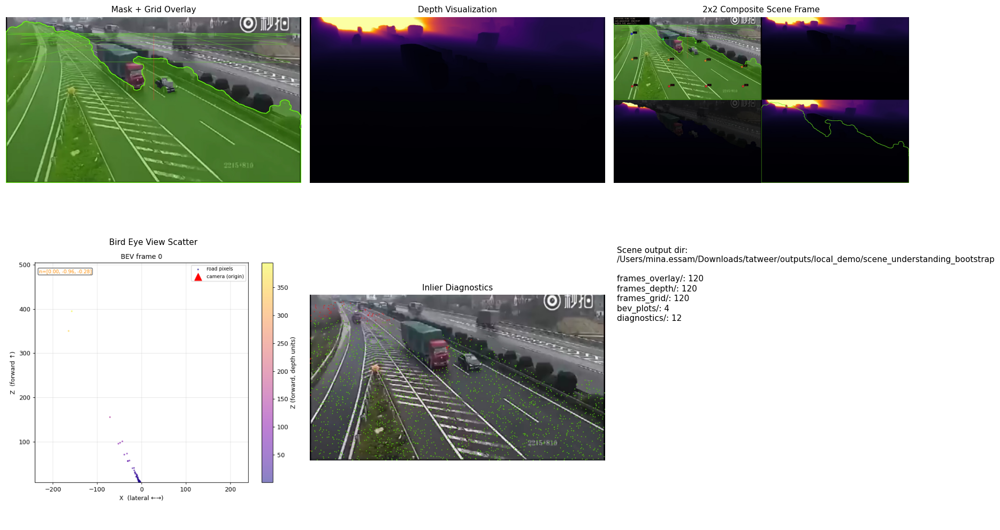

In [16]:
if scene_summary is None:
    print('Scene summary unavailable. Run previous cell first.')
else:
    scene_df = pd.DataFrame(scene_summary['per_frame'])

    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    axes[0].plot(scene_df['frame_idx'], scene_df['inlier_ratio'], marker='o', linewidth=1.2)
    axes[0].axhline(scene_cfg.min_inlier_ratio if scene_cfg else 0.3, linestyle='--', linewidth=1)
    axes[0].set_title('Plane Inlier Ratio by Frame')
    axes[0].set_xlabel('Frame index')
    axes[0].set_ylabel('Inlier ratio')
    axes[0].grid(alpha=0.25)

    valid_series = scene_df['plane_valid'].astype(int)
    axes[1].plot(scene_df['frame_idx'], valid_series, drawstyle='steps-mid')
    axes[1].set_yticks([0, 1])
    axes[1].set_yticklabels(['invalid', 'valid'])
    axes[1].set_title('Plane Validity Timeline')
    axes[1].set_xlabel('Frame index')
    axes[1].grid(alpha=0.25)

    plt.tight_layout()
    plt.show()

    su_root = Path(SCENE_OUTPUT_DIR)
    samples = {
        'overlay': sorted((su_root / 'frames_overlay').glob('*.jpg'))[:1],
        'depth': sorted((su_root / 'frames_depth').glob('*.jpg'))[:1],
        'grid': sorted((su_root / 'frames_grid').glob('*.jpg'))[:1],
        'bev': sorted((su_root / 'bev_plots').glob('*.png'))[:1],
        'diagnostics': sorted((su_root / 'diagnostics').glob('*.jpg'))[:1],
    }

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    slots = [
        ('overlay', 'Mask + Grid Overlay'),
        ('depth', 'Depth Visualization'),
        ('grid', '2x2 Composite Scene Frame'),
        ('bev', 'Bird Eye View Scatter'),
        ('diagnostics', 'Inlier Diagnostics'),
    ]

    for ax, (k, title) in zip(axes.flatten(), slots + [('empty', 'Artifacts')]):
        if k != 'empty' and samples[k]:
            path = str(samples[k][0])
            ax.imshow(mpimg.imread(path))
            ax.set_title(title, fontsize=10)
        elif k == 'empty':
            ax.axis('off')
            ax.text(
                0.01,
                0.95,
                (
                    f'Scene output dir:\n{SCENE_OUTPUT_DIR}\n\n'
                    f"frames_overlay/: {len(list((su_root / 'frames_overlay').glob('*.jpg')))}\n"
                    f"frames_depth/: {len(list((su_root / 'frames_depth').glob('*.jpg')))}\n"
                    f"frames_grid/: {len(list((su_root / 'frames_grid').glob('*.jpg')))}\n"
                    f"bev_plots/: {len(list((su_root / 'bev_plots').glob('*.png')))}\n"
                    f"diagnostics/: {len(list((su_root / 'diagnostics').glob('*.jpg')))}"
                ),
                va='top',
                fontsize=10,
            )
            continue
        else:
            ax.text(0.5, 0.5, f'No {k} image', ha='center', va='center')
        ax.axis('off')

    plt.tight_layout()
    plt.show()


### Run Near-Miss v2.0 (Ground-Plane Aware)

This pass enriches detections with `ground_pt`, deduplicates overlapping detections,
tracks in hybrid 2D/3D (`centroid_v2`), and evaluates near-miss using `NearMissDetectorV20`.


In [18]:
from src.ground_projection import GroundProjector
from src.near_miss import NearMissDetectorV20

# Build intrinsics from current video metadata
_intr_cfg = SceneConfig()
intrinsics = _intr_cfg.build_intrinsics(meta['height'], meta['width'])
projector = GroundProjector(intrinsics, stable_plane, t_max=20.0)

tracker_v20 = create_tracker(
    'centroid_v2',
    max_disappeared=5,
    max_distance=200,
    min_hits=2,
    max_distance_3d=V20_MAX_DIST_3D,
)

nm_v20 = NearMissDetectorV20(
    proximity_px=NEARMISS_COMMON['proximity_px'],
    ttc_threshold=NEARMISS_COMMON['ttc_threshold'],
    fps=EFFECTIVE_FPS,
    debounce_frames=NEARMISS_COMMON['debounce_frames'],
    filters_enabled=NEARMISS_COMMON['filters_enabled'],
    confirm_frames=NEARMISS_COMMON['confirm_frames'],
    min_confidence=NEARMISS_COMMON['min_confidence'],
    same_direction_deg=NEARMISS_COMMON['same_direction_deg'],
    stationary_speed_px=NEARMISS_COMMON['stationary_speed_px'],
    proximity_3d=V20_PROXIMITY_3D,
    speed_3d_min=V20_SPEED_3D_MIN,
    risk_high_threshold=NEARMISS_COMMON['risk_high_threshold'],
    risk_medium_threshold=NEARMISS_COMMON['risk_medium_threshold'],
)

frame_data_v20 = {}
frame_pair_data_v20 = {}
processed_v20 = 0
peak_active_v20 = 0

t0 = time.perf_counter()
for frame_idx, frame in frame_generator(VIDEO_PATH, stride=FRAME_STRIDE):
    if MAX_FRAMES is not None and processed_v20 >= MAX_FRAMES:
        break

    dets = detector.detect(frame)
    dets_3d = projector.enrich_detections([dict(d) for d in dets])
    dets_3d = GroundProjector.dedup_detections(
        dets_3d,
        gp_dist=V20_GP_DEDUP_DIST,
        px_dist=V20_PX_DEDUP_DIST,
    )

    tracked_v20 = tracker_v20.update(dets_3d, frame_idx, frame)
    nm_v20.process_frame(frame_idx, tracked_v20)

    # Keep both 2D and 3D trajectory snapshots for replay
    snap = {
        k: {
            **copy.deepcopy(v),
            'trajectory': list(v.get('trajectory', []))[-TRAIL_KEEP_FRAMES:],
            'trajectory_3d': list(v.get('trajectory_3d', []))[-TRAIL_KEEP_FRAMES:],
        }
        for k, v in tracked_v20.items()
    }
    frame_data_v20[frame_idx] = (snap, list(nm_v20.active_pairs(frame_idx)))
    frame_pair_data_v20[frame_idx] = copy.deepcopy(nm_v20.active_pair_data(frame_idx))

    peak_active_v20 = max(peak_active_v20, len(tracked_v20))
    processed_v20 += 1

elapsed_v20 = time.perf_counter() - t0
events_v20 = nm_v20.get_events_dataframe()
summary_v20 = {
    'total': len(events_v20),
    'high': int((events_v20['risk_level'] == 'High').sum()) if not events_v20.empty else 0,
    'medium': int((events_v20['risk_level'] == 'Medium').sum()) if not events_v20.empty else 0,
    'low': int((events_v20['risk_level'] == 'Low').sum()) if not events_v20.empty else 0,
}

mode_counts = events_v20['mode'].value_counts().to_dict() if (not events_v20.empty and 'mode' in events_v20.columns) else {}

print('v2.0 run summary')
print(f'  processed frames : {processed_v20}')
print(f'  elapsed          : {elapsed_v20:.1f}s ({processed_v20/max(elapsed_v20, 1e-6):.1f} FPS)')
print(f'  tracker IDs      : {tracker_v20.total_ids_assigned} | peak active: {peak_active_v20}')
print(f"  events           : total={summary_v20['total']} (H={summary_v20['high']} M={summary_v20['medium']} L={summary_v20['low']})")
print(f'  mode split       : {mode_counts}')

compare = pd.DataFrame([
    {'variant': 'v11', 'events_total': runs['v11']['summary']['total']},
    {'variant': 'v40', 'events_total': runs['v40']['summary']['total']},
    {'variant': 'v20', 'events_total': summary_v20['total']},
])
display(compare)


[fr=140] pair=(7,47) fallback=2d (id7 ground_pt=ok  id47 ground_pt=MISSING)
[fr=140] pair=(28,47) fallback=2d (id28 ground_pt=ok  id47 ground_pt=MISSING)
[fr=140] pair=(47,48) fallback=2d (id47 ground_pt=MISSING  id48 ground_pt=ok)
[fr=140] pair=(47,49) fallback=2d (id47 ground_pt=MISSING  id49 ground_pt=ok)
[fr=141] pair=(7,47) fallback=2d (id7 ground_pt=ok  id47 ground_pt=MISSING)
[fr=141] pair=(28,47) fallback=2d (id28 ground_pt=ok  id47 ground_pt=MISSING)
[fr=141] pair=(47,48) fallback=2d (id47 ground_pt=MISSING  id48 ground_pt=ok)
[fr=141] pair=(47,49) fallback=2d (id47 ground_pt=MISSING  id49 ground_pt=ok)
[fr=168] pair=(7,57) fallback=2d (id7 ground_pt=ok  id57 ground_pt=MISSING)
[fr=168] pair=(28,57) fallback=2d (id28 ground_pt=ok  id57 ground_pt=MISSING)
[fr=168] pair=(49,57) fallback=2d (id49 ground_pt=ok  id57 ground_pt=MISSING)
[fr=168] pair=(51,57) fallback=2d (id51 ground_pt=ok  id57 ground_pt=MISSING)
[fr=168] pair=(57,58) fallback=2d (id57 ground_pt=MISSING  id58 ground

v2.0 run summary
  processed frames : 458
  elapsed          : 80.1s (5.7 FPS)
  tracker IDs      : 172 | peak active: 14
  events           : total=19 (H=4 M=12 L=3)
  mode split       : {'3d': 18, '2d': 1}


,variant,events_total
0,v11,8
1,v40,7
2,v20,19


v2.0 events: 19


,frame_index,timestamp_sec,object_id_1,object_id_2,label_1,label_2,distance_3d,d_min_3d,ttc_sec,speed_3d_1,speed_3d_2,mode,risk_score,risk_level
0,71,3.55,20,22,truck,truck,0.2110,0.0214,0.576,0.01901,0.00208,3d,0.4924,Medium
1,84,4.20,23,26,truck,truck,0.1333,0.0085,0.347,0.02840,0.00924,3d,0.6379,Medium
2,123,6.15,31,40,car,car,0.1241,0.0095,0.236,0.02652,0.00205,3d,0.6413,Medium
3,124,6.20,35,39,truck,truck,0.1420,0.0144,0.090,0.04090,0.03950,3d,0.6173,Medium
4,127,6.35,39,41,truck,bus,0.7424,0.0251,1.083,0.03950,0.00623,3d,0.4017,Medium
5,156,7.80,7,49,car,bus,0.0830,0.0393,0.228,0.00005,0.01602,3d,0.3718,Low
6,157,7.85,52,54,car,car,0.1238,0.0223,0.333,0.01830,0.00000,3d,0.5134,Medium
7,165,8.25,55,57,car,car,0.1865,0.0082,0.415,0.02290,0.00144,3d,0.6307,Medium
8,173,8.65,58,60,car,car,0.1934,0.0118,0.227,0.04312,0.00239,3d,0.6256,Medium
9,197,9.85,57,74,truck,truck,0.1064,0.0031,0.045,0.20488,0.08618,3d,0.7578,High


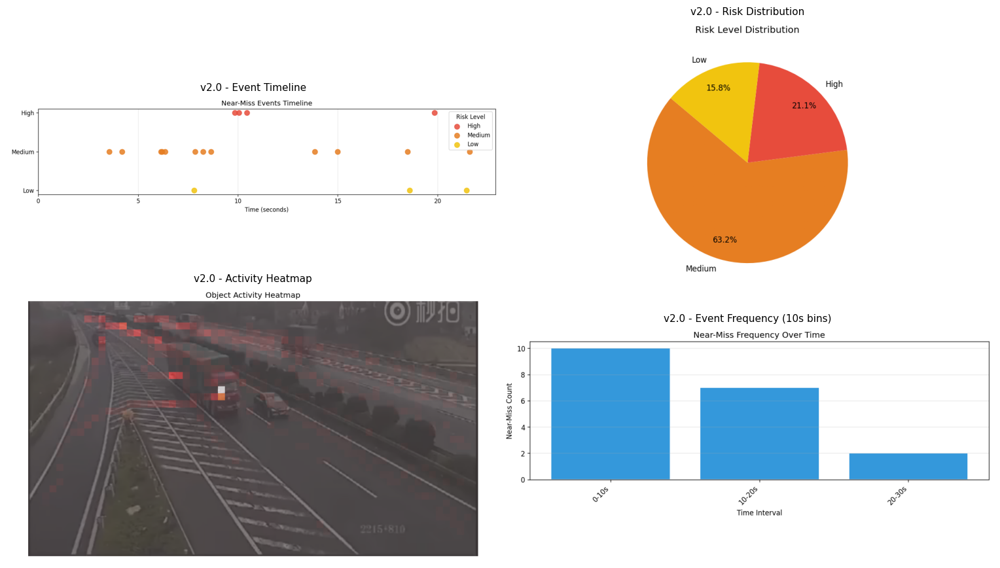

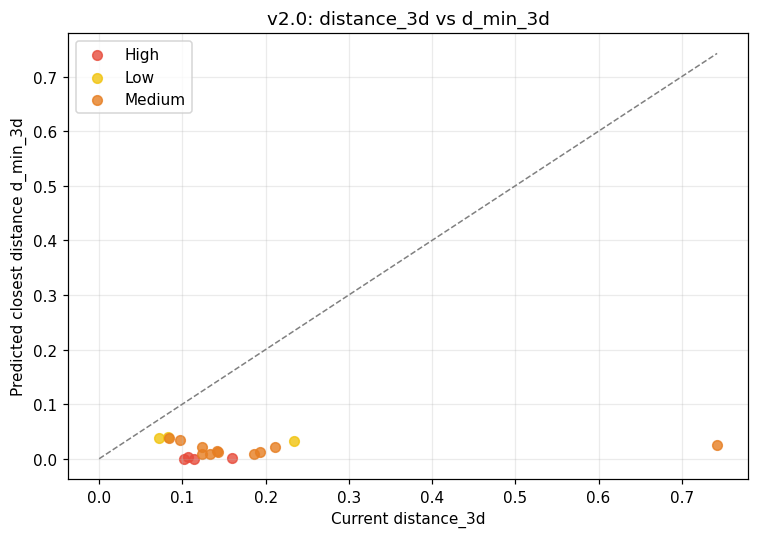

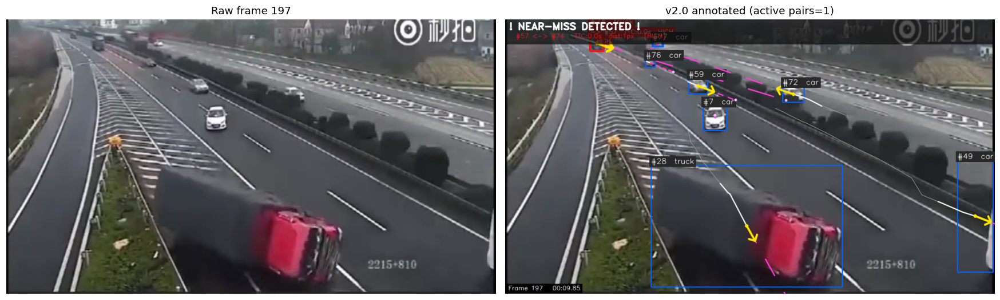

Annotated video saved: /Users/mina.essam/Downloads/tatweer/outputs/local_demo/annotated_v20.mp4
v2.0 video: /Users/mina.essam/Downloads/tatweer/outputs/local_demo/annotated_v20.mp4 (10.1 MB)


In [19]:
print('v2.0 events:', len(events_v20))
if events_v20.empty:
    print('  None')
else:
    show_cols = [
        'frame_index', 'timestamp_sec',
        'object_id_1', 'object_id_2', 'label_1', 'label_2',
        'distance_3d', 'd_min_3d', 'ttc_sec',
        'speed_3d_1', 'speed_3d_2', 'mode',
        'risk_score', 'risk_level',
    ]
    show_cols = [c for c in show_cols if c in events_v20.columns]
    display(events_v20[show_cols].head(25))

# v2 dashboard plots
first_frame_local = first_frame if 'first_frame' in globals() else None
if first_frame_local is None:
    cap = cv2.VideoCapture(VIDEO_PATH)
    ok, first_frame_local = cap.read()
    cap.release()
    assert ok, 'Could not read first frame for v2 dashboard.'

v20_dir = os.path.join(OUTPUT_DIR, 'v20')
os.makedirs(v20_dir, exist_ok=True)

v20_timeline = os.path.join(v20_dir, 'timeline.png')
v20_pie      = os.path.join(v20_dir, 'risk_distribution.png')
v20_heatmap  = os.path.join(v20_dir, 'heatmap.png')
v20_freq     = os.path.join(v20_dir, 'frequency.png')

plot_timeline(events_v20, analysed_sec, v20_timeline)
plot_risk_distribution(events_v20, v20_pie)
plot_heatmap(tracker_v20.all_trajectories, first_frame_local, v20_heatmap)
plot_frequency(events_v20, analysed_sec, v20_freq, bin_sec=10)

fig, axes = plt.subplots(2, 2, figsize=(14, 8))
for ax, (path, title) in zip(axes.flatten(), [
    (v20_timeline, 'Event Timeline'),
    (v20_pie, 'Risk Distribution'),
    (v20_heatmap, 'Activity Heatmap'),
    (v20_freq, 'Event Frequency (10s bins)'),
]):
    ax.imshow(mpimg.imread(path))
    ax.set_title(f'v2.0 - {title}', fontsize=10)
    ax.axis('off')
plt.tight_layout()
plt.show()

if not events_v20.empty and {'distance_3d', 'd_min_3d'}.issubset(events_v20.columns):
    sub = events_v20.dropna(subset=['distance_3d', 'd_min_3d'])
    if not sub.empty:
        fig, ax = plt.subplots(figsize=(7, 5))
        cmap = {'High': '#e74c3c', 'Medium': '#e67e22', 'Low': '#f1c40f'}
        for level, sdf in sub.groupby('risk_level'):
            ax.scatter(sdf['distance_3d'], sdf['d_min_3d'],
                       c=cmap.get(level, '#3498db'), s=40, alpha=0.8, label=level)
        m = max(sub['distance_3d'].max(), sub['d_min_3d'].max())
        ax.plot([0, m], [0, m], '--', color='gray', linewidth=1)
        ax.set_title('v2.0: distance_3d vs d_min_3d')
        ax.set_xlabel('Current distance_3d')
        ax.set_ylabel('Predicted closest distance d_min_3d')
        ax.grid(alpha=0.25)
        ax.legend(loc='upper left')
        plt.tight_layout()
        plt.show()

# Debug frame overlay (v2)
def _pick_v20_frame():
    if not events_v20.empty:
        return int(events_v20.sort_values('risk_score', ascending=False).iloc[0]['frame_index'])
    keys = sorted(frame_data_v20.keys())
    return int(keys[len(keys)//2])

v20_frame_idx = _pick_v20_frame()
cap = cv2.VideoCapture(VIDEO_PATH)
cap.set(cv2.CAP_PROP_POS_FRAMES, v20_frame_idx)
ok, raw = cap.read()
cap.release()
assert ok, f'Could not read frame {v20_frame_idx}'

snap, apairs = frame_data_v20[v20_frame_idx]
pd_v20 = frame_pair_data_v20.get(v20_frame_idx, {})
ann_v20 = annotate_frame(
    raw, snap, apairs, v20_frame_idx, EFFECTIVE_FPS,
    pair_data=pd_v20,
    debug_pred_paths=True,
    pred_horizon_sec=PRED_HORIZON_SEC,
    pred_step_sec=PRED_STEP_SEC,
    pred_min_speed_px=PRED_MIN_SPEED_PX,
)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
axes[0].imshow(cv2.cvtColor(raw, cv2.COLOR_BGR2RGB))
axes[0].set_title(f'Raw frame {v20_frame_idx}')
axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(ann_v20, cv2.COLOR_BGR2RGB))
axes[1].set_title(f'v2.0 annotated (active pairs={len(apairs)})')
axes[1].axis('off')
plt.tight_layout()
plt.show()

if WRITE_V20_VIDEO:
    v20_video = os.path.join(OUTPUT_DIR, 'annotated_v20.mp4')
    create_annotated_video(
        video_path=VIDEO_PATH,
        output_path=v20_video,
        frame_data=frame_data_v20,
        fps=EFFECTIVE_FPS,
        frame_pair_data=frame_pair_data_v20,
        debug_pred_paths=True,
        pred_horizon_sec=PRED_HORIZON_SEC,
        pred_step_sec=PRED_STEP_SEC,
        pred_min_speed_px=PRED_MIN_SPEED_PX,
    )
    print(f'v2.0 video: {v20_video} ({os.path.getsize(v20_video)/1e6:.1f} MB)')
